In [ ]:
import sys
import os
import json
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import numpy as np
import cv2
import matplotlib.pyplot as plt

from pathlib import Path
# Add the parent directory to the Python path
sys.path.append(str(Path().resolve().parent))
import utils
import trainer
import evaluator
import data_process
import motion_blur

# Set random seed for reproducibility
seed = 211
np.random.seed(seed)
torch.manual_seed(seed)

In [3]:
input_size = 448

transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((input_size, input_size)),
    torchvision.transforms.ToTensor(), # uint8 values in [0, 255] -> float tensor with values [0, 1]
    torchvision.transforms.Normalize(mean=data_process.train_mean.tolist(), std=data_process.train_std.tolist())
])

train_set, val_set, test_set = data_process.load_data(transform=transform, input_size=input_size, img_dir=os.path.join('..', data_process.img_dir), ann_dir=os.path.join('..', data_process.ann_dir))   

test_set_uni_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.01})
test_set_uni_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.05})
test_set_uni_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'uniform', 'a': 0.1})
test_set_elli_001 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.01})
test_set_elli_005 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.05})
test_set_elli_01 = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'ellipse', 'a': 0.1})
test_set_nat = data_process.NoisySubset(test_set, noise_fn=motion_blur.motion_blur, noise_params={'kernel_type': 'natural', 'kernel_path': '../data/motion_blur_data'})

Data already exists

Number of valid images: 664
Train set size: 464 - 69.88%
Validation set size: 67 - 10.09%
Test set size: 133 - 20.03%



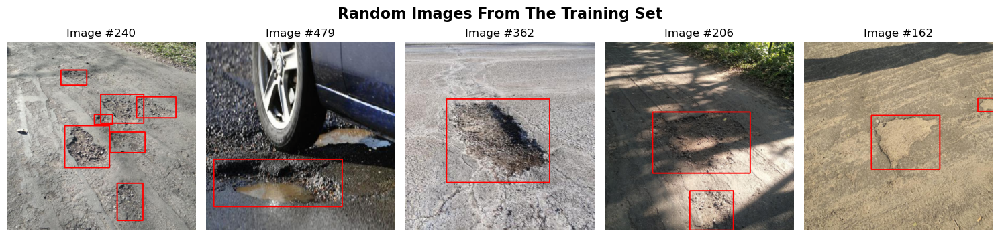

In [4]:
# Display 5 random images from the training set
train_loader = DataLoader(train_set, batch_size=5, shuffle=True, collate_fn=data_process.collate_fn)
images, targets = next(iter(train_loader))
data_process.show_images(images, targets, title="Random Images From The Training Set")

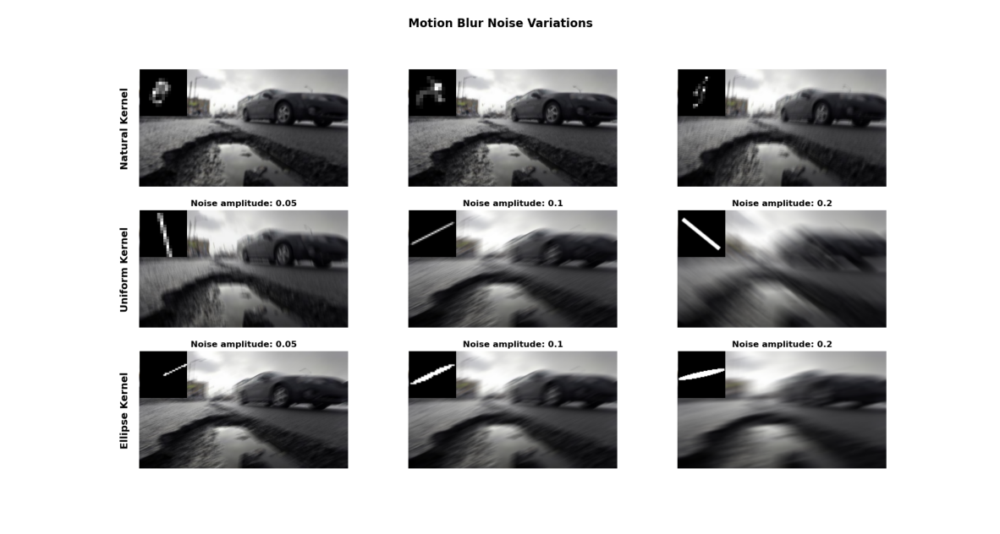

In [7]:
#show noise types
image = cv2.imread("../data/motion_blur_data/motion_blur_types.png")
# Convert BGR to RGB for matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display using matplotlib
plt.figure(figsize=(15, 15))
plt.imshow(image_rgb)
plt.axis('off')  # Turn off axis
plt.title("", fontsize=16)
plt.show()

In [6]:
# Train with data augmentation:
history = trainer.train_from_config(model_config_path="../data/models/fasterrcnn_mobilenet_v3_large_fpn/fasterrcnn_mobilenet_v3_large_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/fasterrcnn_mobilenet_v3_large_fpn", kornia_aug=False)

Starting training for fasterrcnn_mobilenet_v3_large_fpn with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'SGD', 'lr': 0.005562807003835387, 'momentum': 0.9328567236871179, 'weight_decay': 7.349985786517183e-05, 'scheduler': 'ReduceLROnPlateau', 'factor': 0.3997437126341112, 'patience': 4}
Epoch 1/100, Train Loss: 33.3892, Val mAP@50: 0.4558, FPS: 157.67, Epoch Time: 7.89 seconds
Epoch 2/100, Train Loss: 25.3647, Val mAP@50: 0.5393, FPS: 175.21, Epoch Time: 7.31 seconds
Epoch 3/100, Train Loss: 24.7784, Val mAP@50: 0.5188, FPS: 182.15, Epoch Time: 7.20 seconds
Epoch 4/100, Train Loss: 22.1463, Val mAP@50: 0.6065, FPS: 199.67, Epoch Time: 7.13 seconds
Epoch 5/100, Train Loss: 22.0851, Val mAP@50: 0.5659, FPS: 209.81, Epoch Time: 6.98 seconds
Epoch 6/100, Train Loss: 20.7721, Val mAP@50: 0.5861, FPS: 197.96, Epoch Time: 7.06 seconds
Epoch 7/100, Train Loss: 21.0372, Val mAP@50: 0.6223, FPS: 203.49, Epoch Time: 7.00 seconds
Epoch

Mean Average Precision @ 0.5 : 0.5574 FPS: 190.84


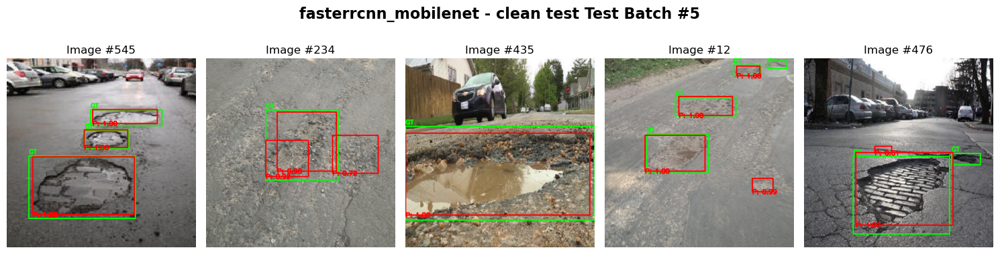

Mean Average Precision @ 0.5 : 0.4826 FPS: 197.16


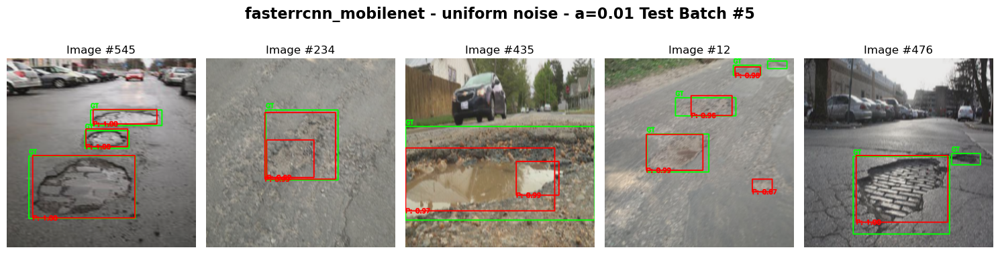

Mean Average Precision @ 0.5 : 0.1577 FPS: 202.18


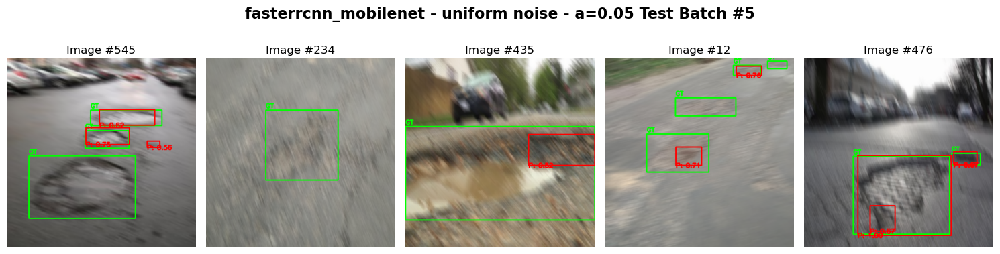

Mean Average Precision @ 0.5 : 0.0494 FPS: 210.68


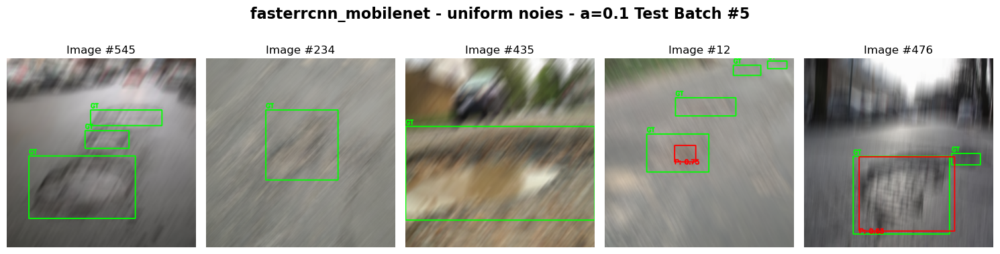

Mean Average Precision @ 0.5 : 0.4875 FPS: 195.95


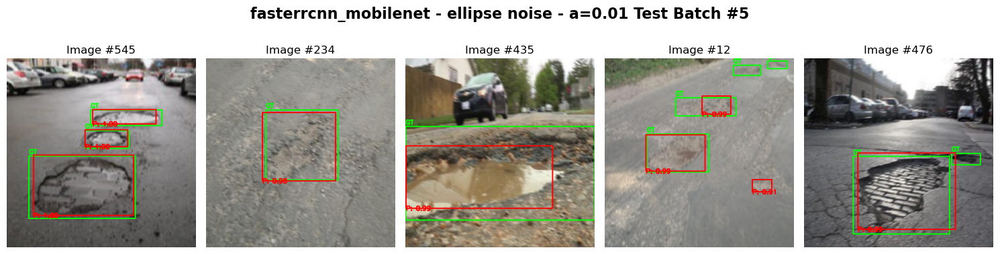

Mean Average Precision @ 0.5 : 0.1586 FPS: 201.12


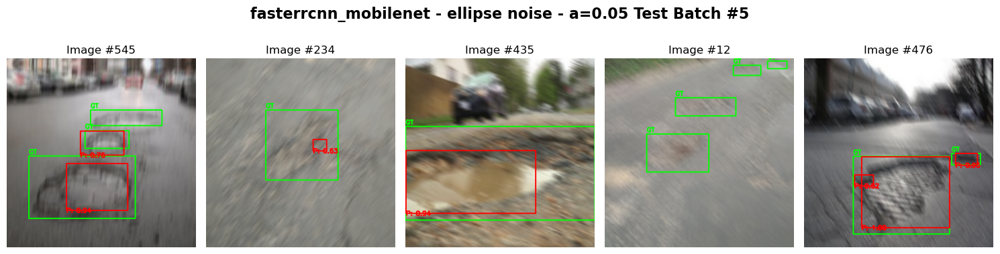

Mean Average Precision @ 0.5 : 0.0337 FPS: 208.15


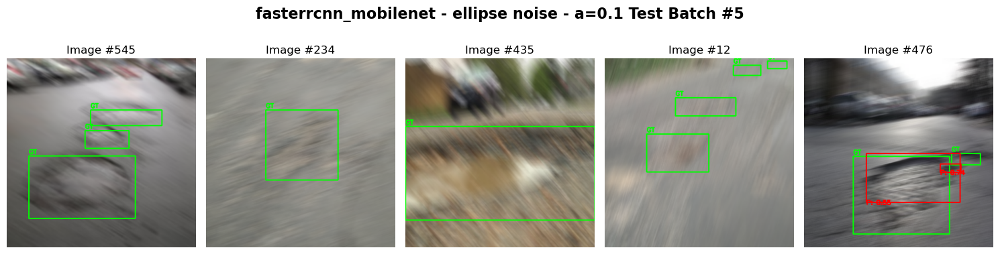

Mean Average Precision @ 0.5 : 0.2797 FPS: 202.49


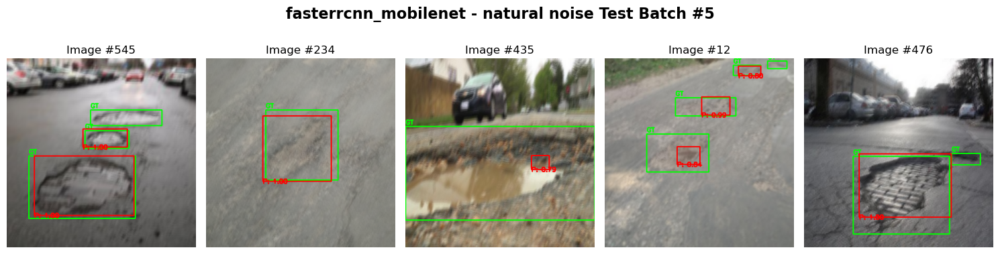

In [7]:
model_name = "fasterrcnn_mobilenet_v3_large_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/fasterrcnn_mobilenet_v3_large_fpn/fasterrcnn_mobilenet_v3_large_fpn_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fasterrcnn_mobilenet - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fasterrcnn_mobilenet - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fasterrcnn_mobilenet - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fasterrcnn_mobilenet - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fasterrcnn_mobilenet - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fasterrcnn_mobilenet - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fasterrcnn_mobilenet - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fasterrcnn_mobilenet - natural noise")

In [8]:
# save history to .json file
utils.update_json(history, model_name="fasterrcnn_mobilenet", save_path='../')

In [9]:
# Train with data augmentation:
trainer.train_from_config(model_config_path="../data/models/fasterrcnn_mobilenet_v3_large_fpn/fasterrcnn_mobilenet_v3_large_fpn_best_params.json", train_set=train_set, val_set=val_set, save_path="../data/models/fasterrcnn_mobilenet_v3_large_fpn", kornia_aug=True)

Starting training for fasterrcnn_mobilenet_v3_large_fpn with the following parameters:
{'batch_size': 8, 'epochs': 100, 'preweight_mode': 'fine_tuning', 'optimizer': 'SGD', 'lr': 0.005562807003835387, 'momentum': 0.9328567236871179, 'weight_decay': 7.349985786517183e-05, 'scheduler': 'ReduceLROnPlateau', 'factor': 0.3997437126341112, 'patience': 4}
Epoch 1/100, Train Loss: 33.0624, Val mAP@50: 0.4363, FPS: 157.47, Epoch Time: 7.80 seconds
Epoch 2/100, Train Loss: 25.8562, Val mAP@50: 0.4550, FPS: 185.69, Epoch Time: 7.62 seconds
Epoch 3/100, Train Loss: 23.4525, Val mAP@50: 0.5144, FPS: 194.79, Epoch Time: 7.50 seconds
Epoch 4/100, Train Loss: 23.2914, Val mAP@50: 0.5344, FPS: 195.14, Epoch Time: 7.41 seconds
Epoch 5/100, Train Loss: 23.9628, Val mAP@50: 0.5576, FPS: 199.36, Epoch Time: 7.48 seconds
Epoch 6/100, Train Loss: 23.0681, Val mAP@50: 0.5963, FPS: 197.60, Epoch Time: 7.35 seconds
Epoch 7/100, Train Loss: 23.5104, Val mAP@50: 0.6051, FPS: 207.25, Epoch Time: 7.30 seconds
Epoch

{'train_losses': [33.06244120001793,
  25.856210231781006,
  23.452489405870438,
  23.291437596082687,
  23.96278753876686,
  23.068068712949753,
  23.510419353842735,
  23.023724362254143,
  22.60367801785469,
  21.73365294933319,
  22.206863284111023,
  22.345116674900055,
  24.256814315915108,
  20.932765379548073,
  21.50659780204296,
  19.671842381358147,
  19.84715200960636,
  18.83158378303051,
  20.606768175959587,
  18.8843112885952,
  20.058247819542885,
  19.24941335618496,
  18.845077127218246,
  18.987758576869965,
  19.116689011454582,
  17.10873445868492,
  19.50570872426033,
  18.83875885605812,
  17.31677410006523,
  16.091670483350754,
  15.7725251019001,
  15.892521381378174,
  16.969882056117058,
  16.60296392440796,
  16.206524804234505,
  16.53221222758293,
  15.301548019051552,
  13.811480686068535,
  15.707667991518974,
  14.758367039263248,
  15.833716198801994,
  13.871796295046806,
  15.444212451577187,
  15.679642453789711,
  14.4820107370615,
  14.623887881

Mean Average Precision @ 0.5 : 0.5224 FPS: 198.46


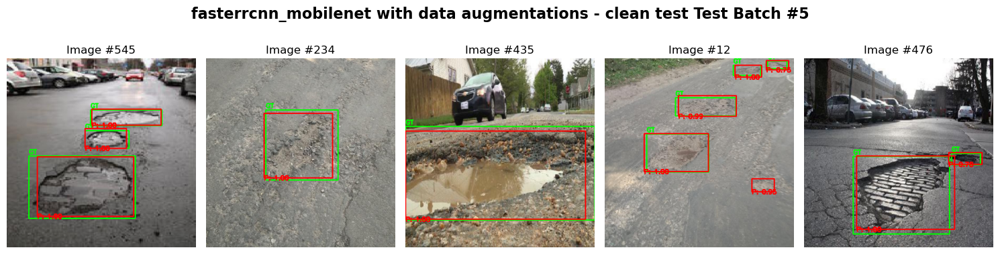

Mean Average Precision @ 0.5 : 0.5459 FPS: 194.40


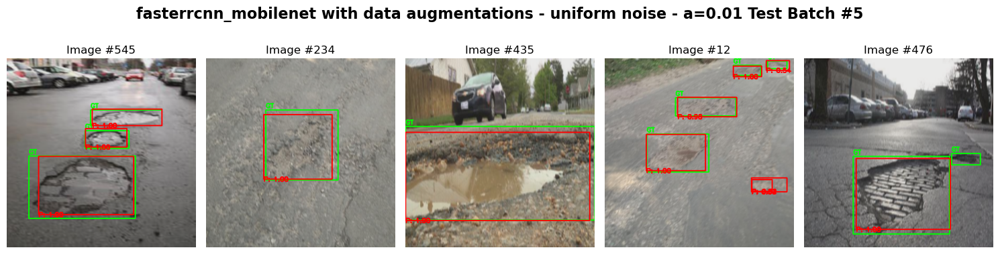

Mean Average Precision @ 0.5 : 0.4626 FPS: 186.41


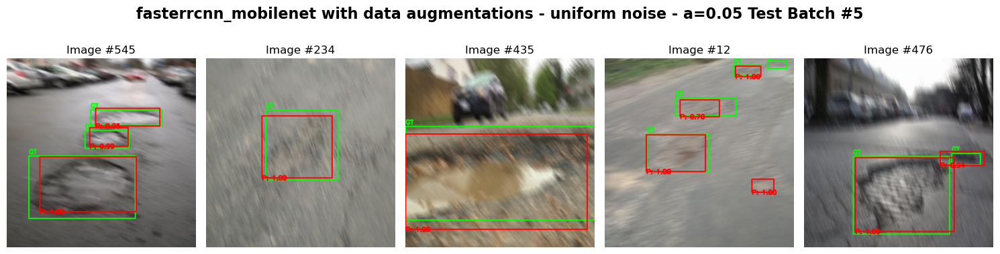

Mean Average Precision @ 0.5 : 0.3625 FPS: 182.61


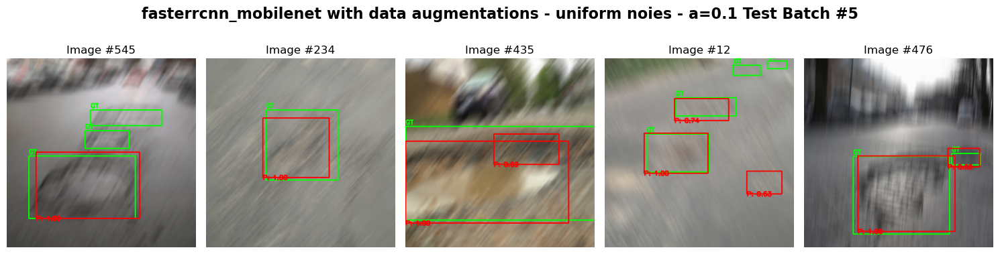

Mean Average Precision @ 0.5 : 0.5343 FPS: 196.06


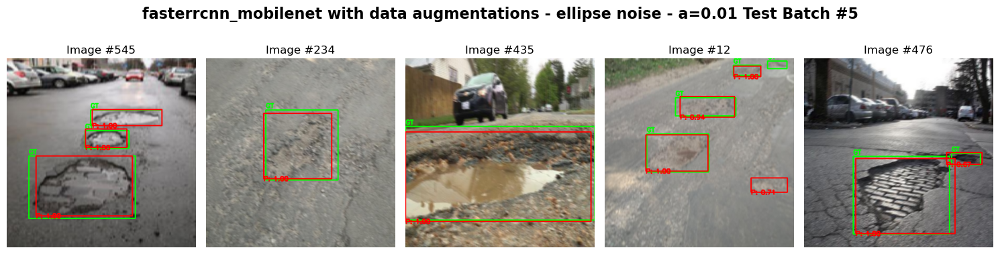

Mean Average Precision @ 0.5 : 0.4192 FPS: 187.08


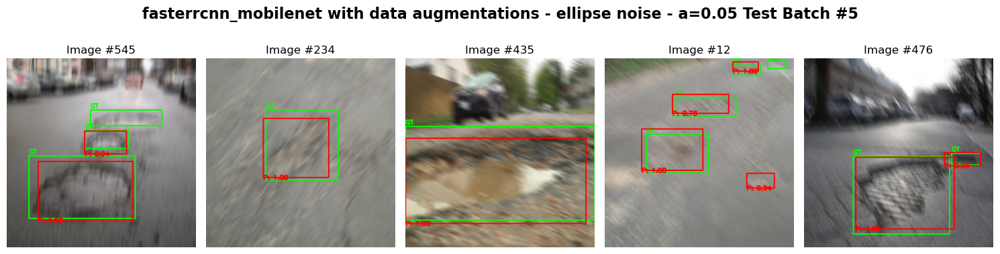

Mean Average Precision @ 0.5 : 0.2915 FPS: 178.63


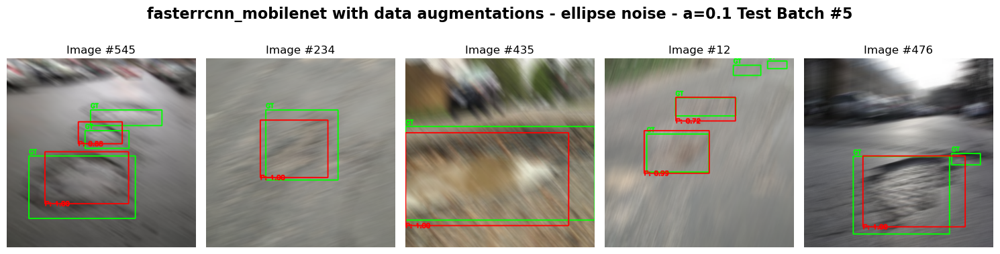

Mean Average Precision @ 0.5 : 0.4266 FPS: 195.66


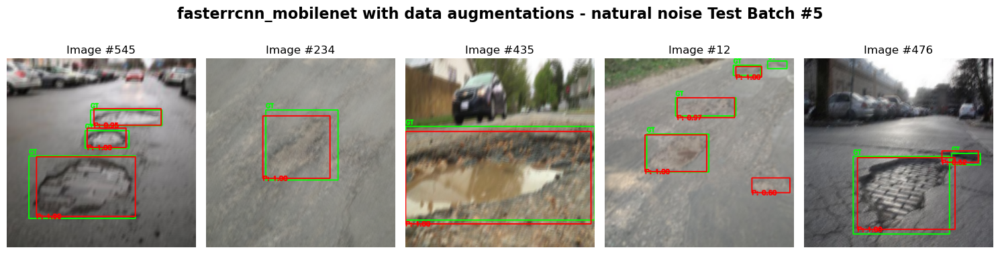

In [10]:
model_name = "fasterrcnn_mobilenet_v3_large_fpn"
model = trainer.get_model(model_name=model_name) 
state_dict = torch.load("../data/models/fasterrcnn_mobilenet_v3_large_fpn/fasterrcnn_mobilenet_v3_large_fpn_aug_best.pth", weights_only=True)
model.load_state_dict(state_dict)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)  # Move the model to the GPU
model.eval()  # Set the model to evaluation mode

# test the model
batch_index = 5
history['test_map50'] = evaluator.test_model(model, test_set, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - clean test")
history['uni001_map50'] = evaluator.test_model(model, test_set_uni_001, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - uniform noise - a=0.01")
history['uni005_map50'] = evaluator.test_model(model, test_set_uni_005, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - uniform noise - a=0.05")
history['uni01_map50'] = evaluator.test_model(model, test_set_uni_01, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - uniform noies - a=0.1")
history['eli001_map50'] = evaluator.test_model(model, test_set_elli_001, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - ellipse noise - a=0.01")
history['eli005_map50'] = evaluator.test_model(model, test_set_elli_005, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - ellipse noise - a=0.05")
history['eli01_map50'] = evaluator.test_model(model, test_set_elli_01, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - ellipse noise - a=0.1")
history['nat_map50'] = evaluator.test_model(model, test_set_nat, index=batch_index, title="fasterrcnn_mobilenet with data augmentations - natural noise")

In [11]:
# save history to .json file
utils.update_json(history, model_name="fasterrcnn_mobilenet_aug", save_path='../')